# **Counting Coins challenge for Course work 1 of Image processing and Machine Vision module**

The first step is to upload the test images for processing.

In [ ]:
from google.colab import files
uploaded = files.upload()
# this import function allows for multi file upload so all 10 test images can be uploaded at once for ease of testing, a loop was incorporated later in the code for all images to be processed together

Saving coins1.jpg to coins1 (15).jpg
Saving coins2.jpg to coins2 (7).jpg
Saving coins3.jpg to coins3 (7).jpg
Saving coins4.jpg to coins4 (7).jpg
Saving coins5.jpg to coins5 (7).jpg
Saving coins6.jpg to coins6 (7).jpg
Saving coins7.jpg to coins7 (7).jpg
Saving coins8.jpg to coins8 (7).jpg
Saving coins9.jpg to coins9 (7).jpg
Saving coins10.jpg to coins10 (7).jpg


Open all of  the uploaded images and convert them to HSV. Store all the colour channel values into an array of 3 matrices, which are then stored in img_HSV[i]

In [ ]:
#To HSV
import cv2
img_HSV=[] #array (list) of HSV images
filename=[] #array (list) of file names
i=0
for fn in uploaded.keys(): #for each filename
  filename.append(fn) #append to filenames array
  #open the uploaded image file and convert from BGR to HSV
  hsv = cv2.cvtColor(cv2.imread(filename[i]), cv2.COLOR_BGR2HSV)
  #hsv is single image with 3 channels (H, S, V)
  img_HSV.append(cv2.split(hsv))  #split to array of 3 images, add to HSV array
  i = i + 1
print('Converted '+str( len(img_HSV) )+' images')
Vdim = hsv.shape[0] #rows
Hdim = hsv.shape[1] #cols
print('Hdim: ' + str(Hdim) + '; Vdim: ' + str(Vdim))


Converted 10 images
Hdim: 1600; Vdim: 1600


This section/stage of the code deals with the processing of the image's using a watershed algorithm using OpenCV. This allows for the identification and seperation of coins within the given image.

This process is done by first applying Laplacian filtering to help enhance the edges within the image. The next step is to convert the image to binary using thresholding. In the case where objects are touching a Morphological operation, opening and erosion is used to help seperate these touching objects to help with identification. A distance transform is ised to find the centre of objects so that they can be used as markers for the watershed algorithm.

With the preproccessing done, the watershed algorithm can then begin to segment the image to identify and seperate the individual coins.
Finally the code visualises the result by colouring each segement object with a unique colour and overlays this over the image.

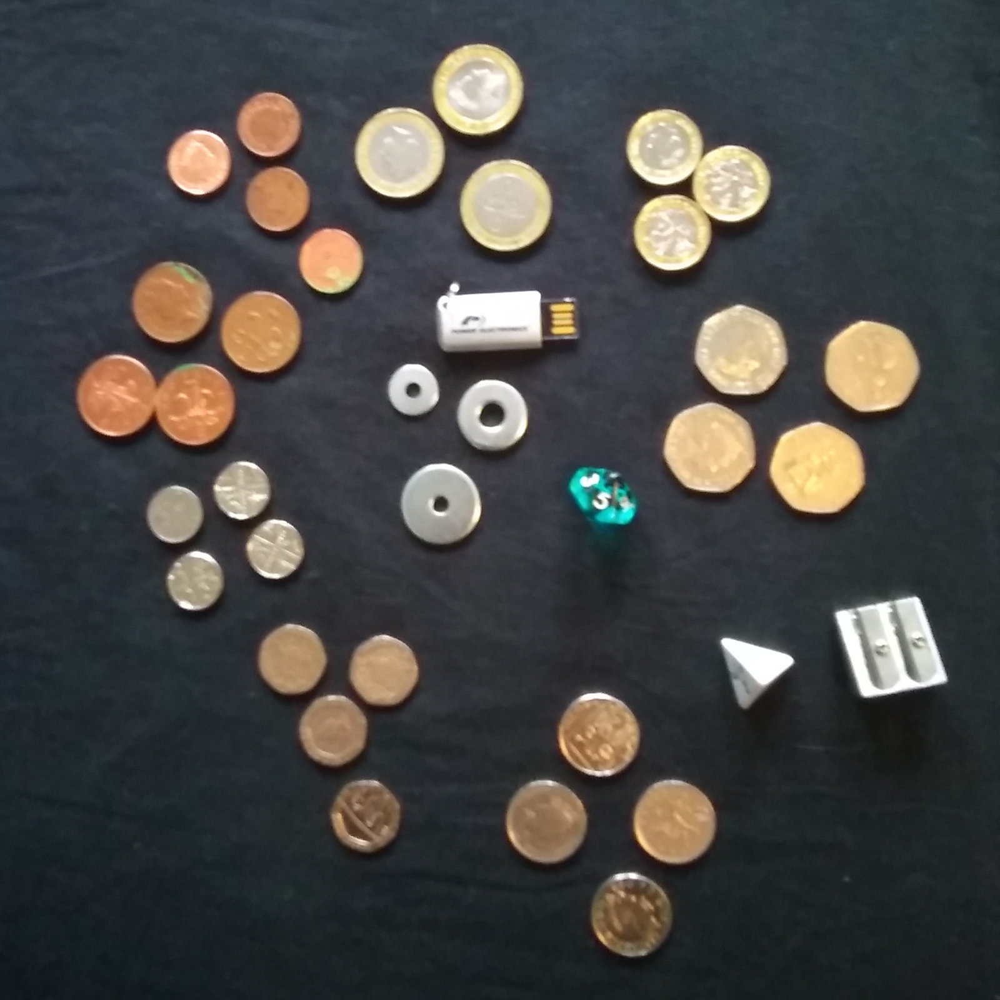

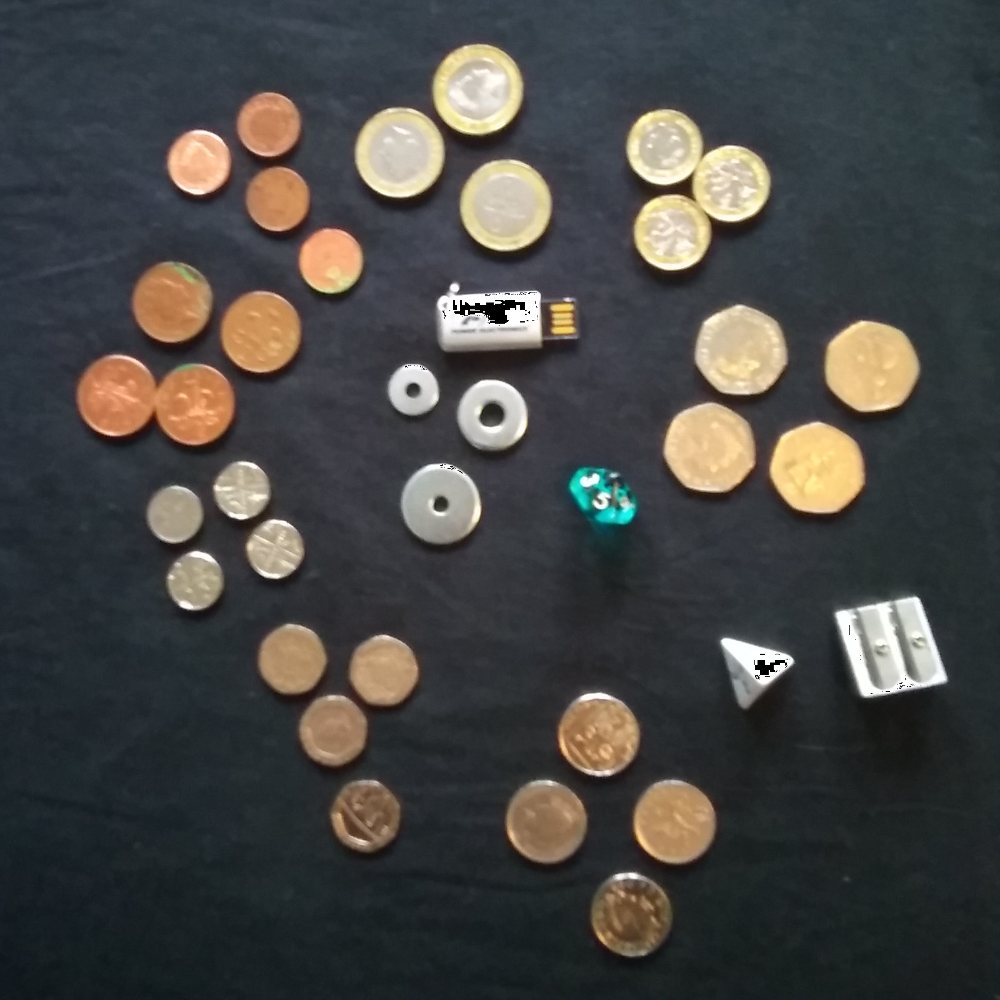

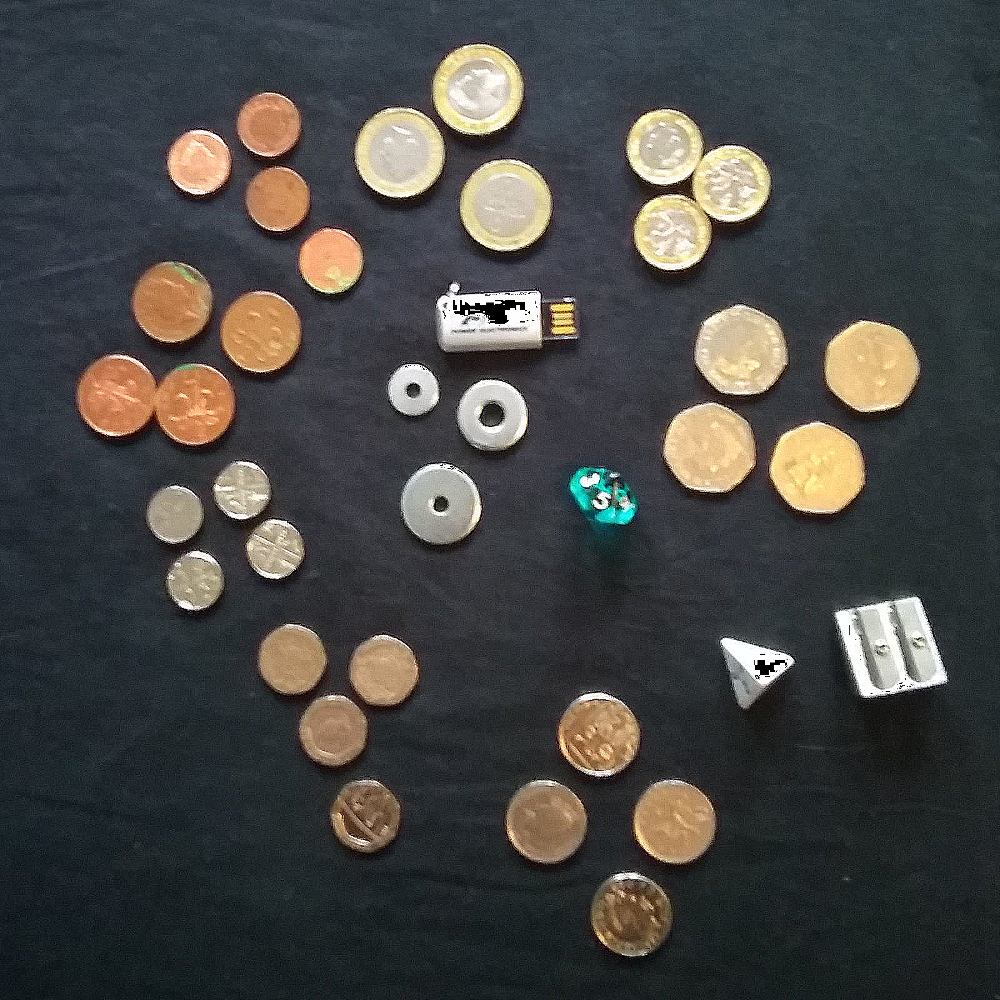

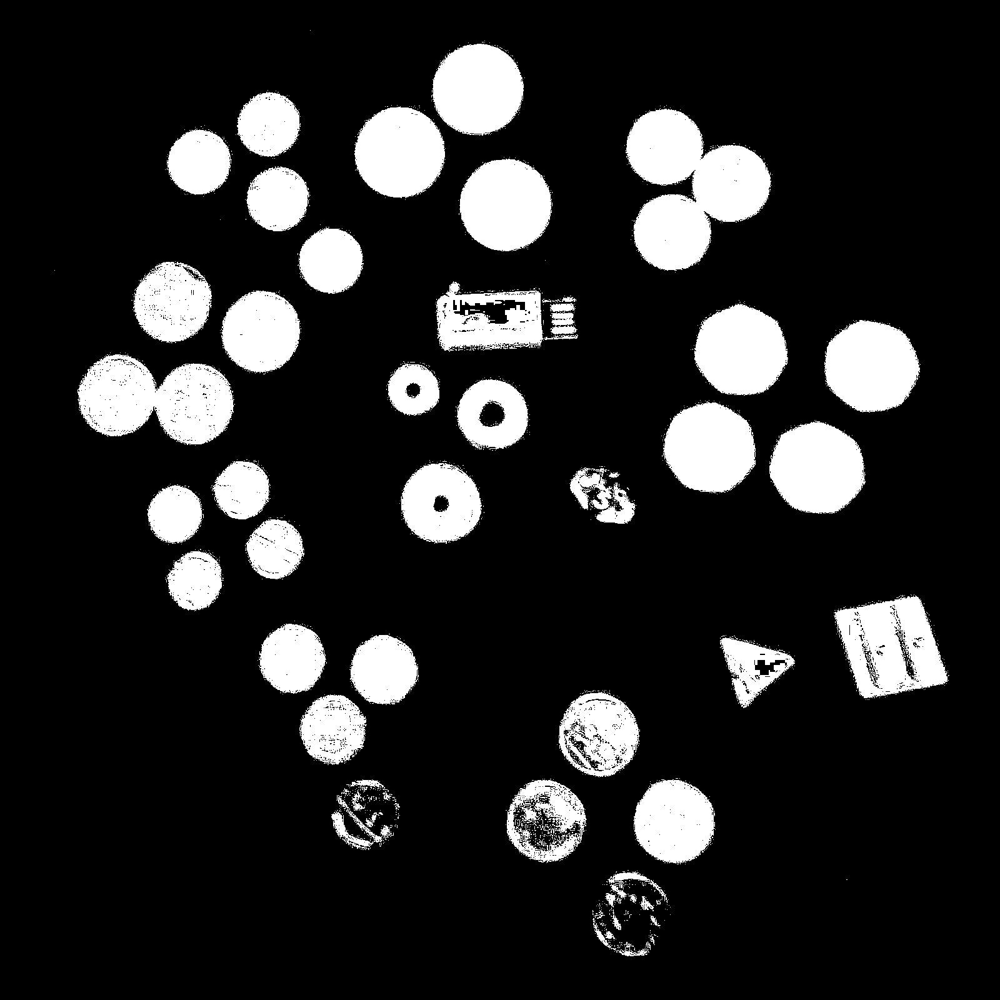

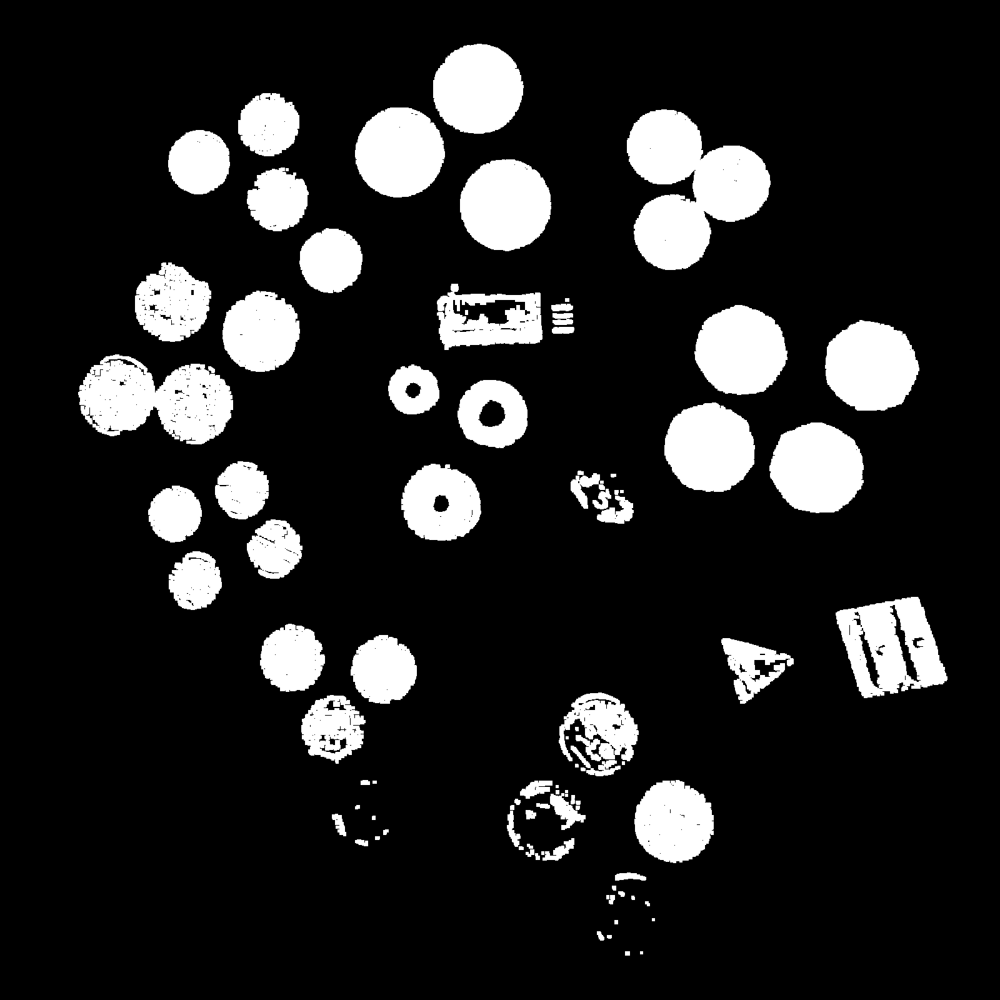

...

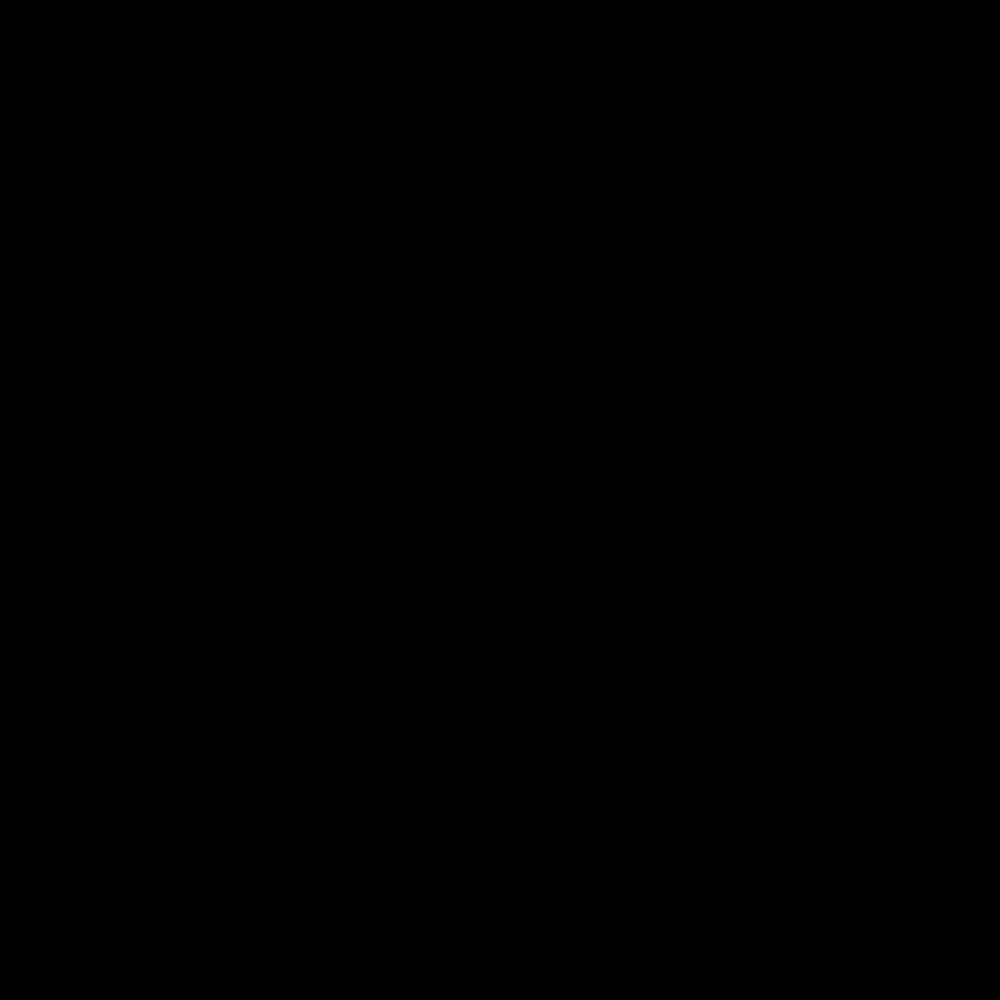

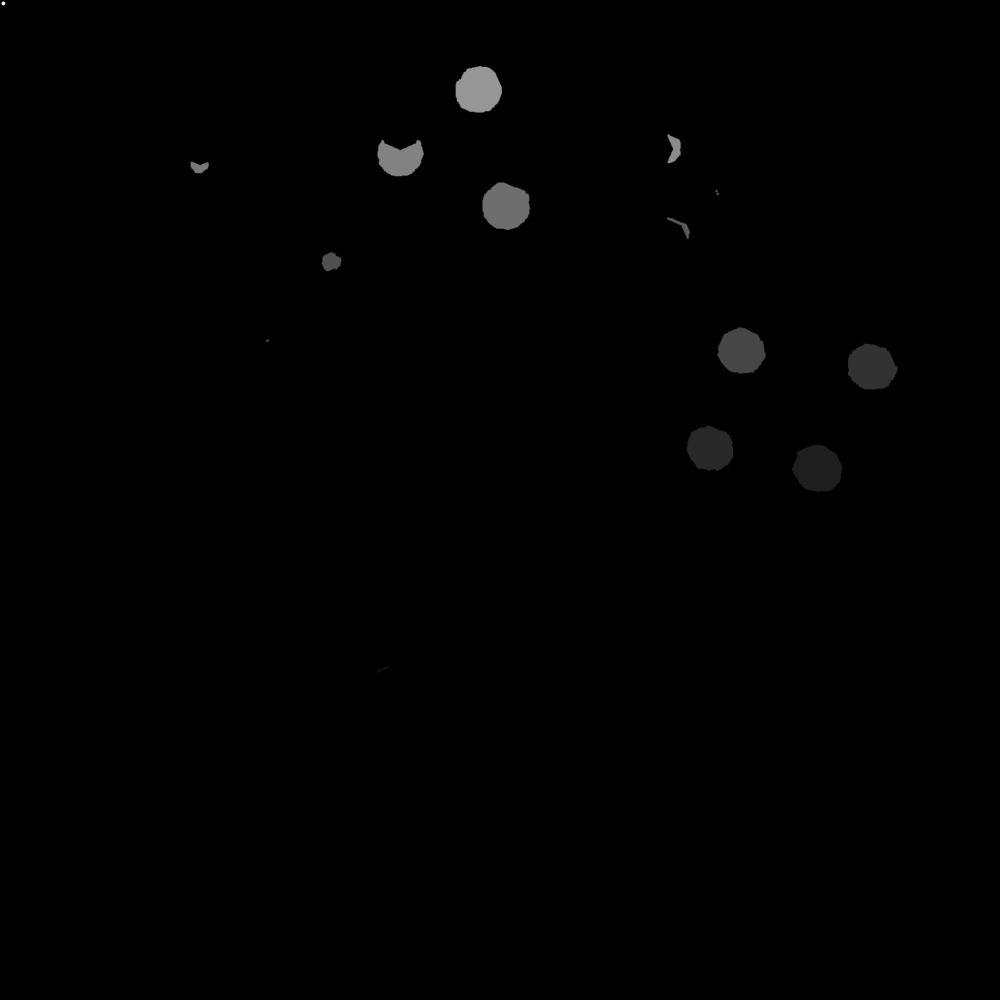

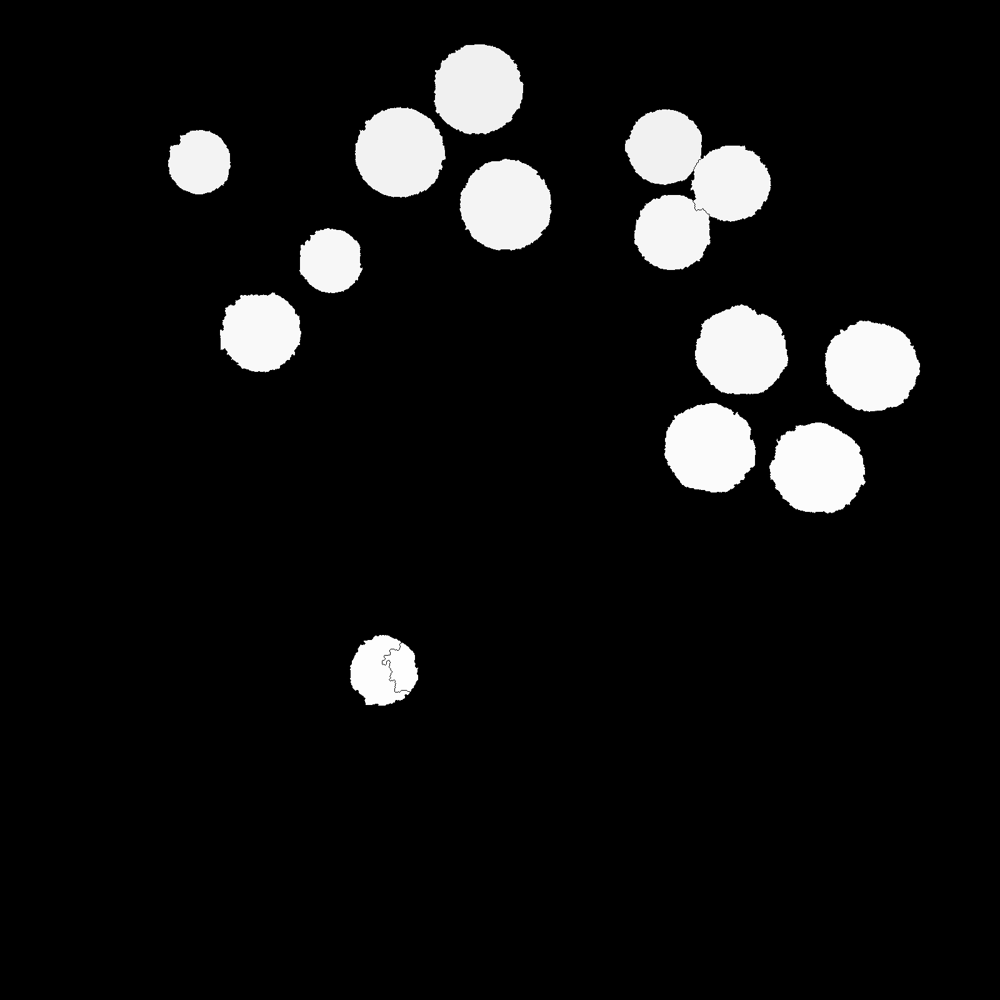

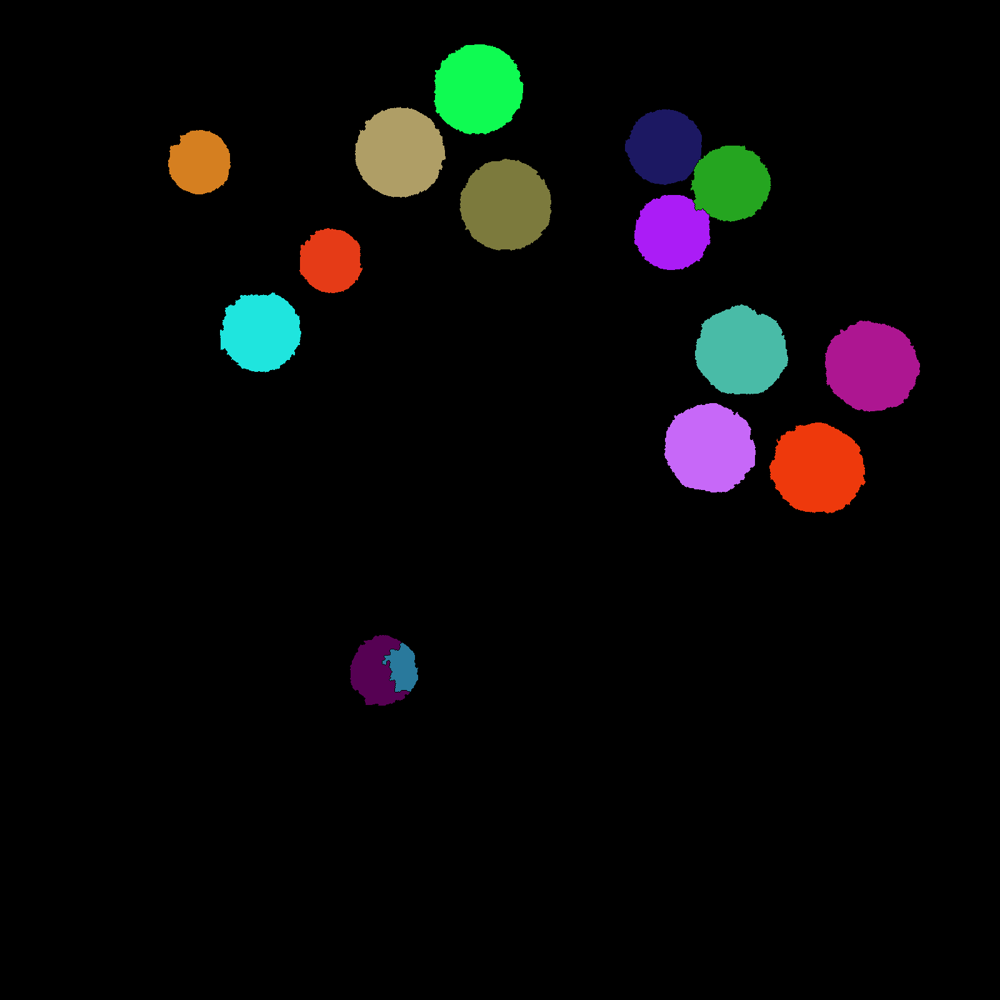

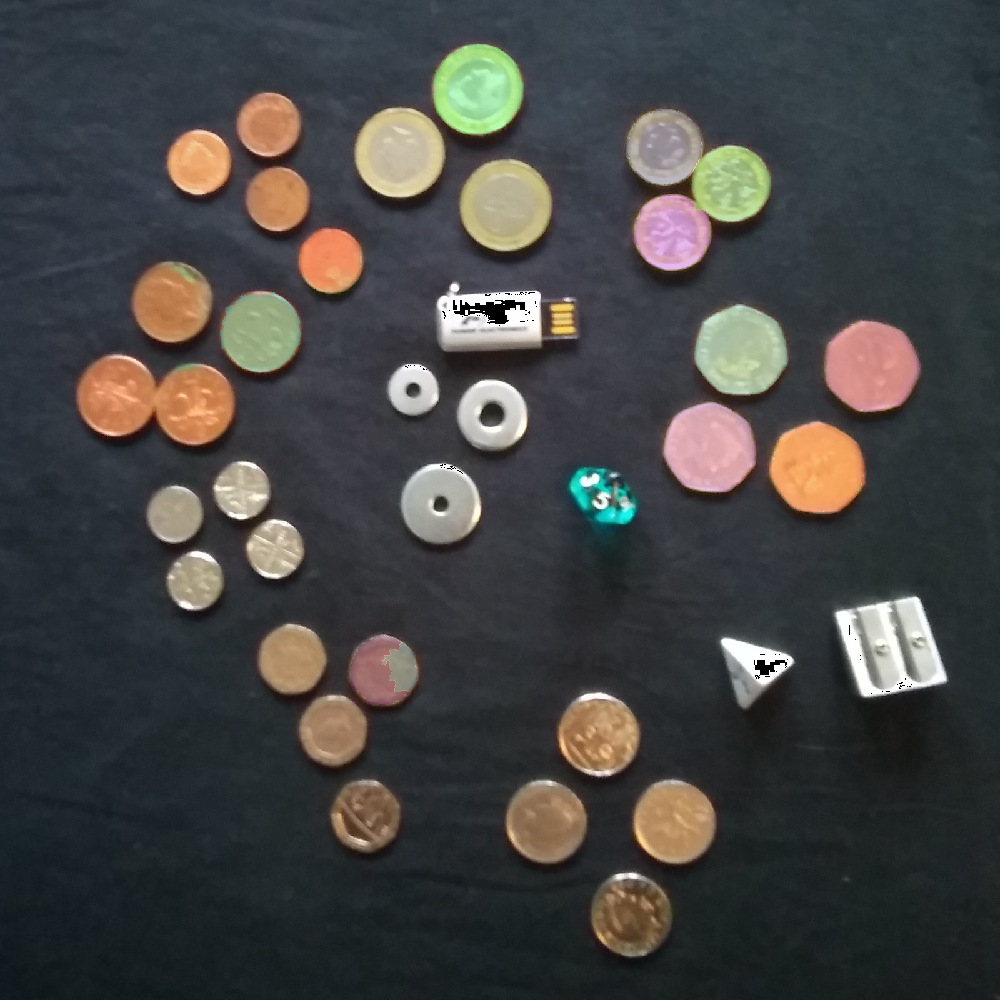

In [ ]:

import cv2 # Import the OpenCV library with the alias cv2 ( this was found out really quickly that a lot of examples online ran with the older cv libary thus causing issues with colab so imported cv2 and changed names of called functions to also be updated to cv2 such as cv.imshow to cv2_imshow)
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow for displaying images in Colab (prev was cv2.imshow but had issues with colab so was recommended to import a patch that corrected the function all comments mentioning it were kept for help with version control)

import pandas as pd
from google.colab import files
import matplotlib.pyplot as plt


image_to_use = 0  # Replace with the index of the image you want to use
# Load the source image using cv2.imread
src = cv2.imread(filename[image_to_use])

# Show source image
cv2_imshow(src) # Use cv2_imshow instead of cv2.imshow, pass only the image
src[np.all(src == 255, axis=2)] = 0 #set all pure white pixels to black (removes white background artifacts )
# Show output image
cv2_imshow(src)

# Replace all instances of cv2.imshow with cv2_imshow in the rest of the code(this is from when the colab patch was imported to correct the function)

kernel = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]], dtype=np.float32)
# "do the laplacian filtering as it is (this section on the laplacian filtering was taken from the OpenCV bootcamp tutorial on distance transforms, the original comments were kept for my own help in understanding how the process worked)
# well, we need to convert everything in something more deeper then CV_8U
# because the kernel has some negative values,
# and we can expect in general to have a Laplacian image with negative values
# BUT a 8bits unsigned int (the one we are working with) can contain values from 0 to 255
# so the possible negative number will be truncated"-https://docs.opencv.org/3.4/d2/dbd/tutorial_distance_transform.html
imgLaplacian = cv2.filter2D(src, cv2.CV_32F, kernel)
sharp = np.float32(src) #convert to float for processing
imgResult = sharp - imgLaplacian #subtract laplace image from original to sharpen the image
# convert back to 8bits gray scale
imgResult = np.clip(imgResult, 0, 255)
imgResult = imgResult.astype('uint8') #convert back to 8bit once processing is complete
imgLaplacian = np.clip(imgLaplacian, 0, 255)
imgLaplacian = np.uint8(imgLaplacian)
cv2_imshow(imgResult)

#convert sharpened image to grayscale
bw = cv2.cvtColor(imgResult, cv2.COLOR_BGR2GRAY)
_, bw = cv2.threshold(bw, 40, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU) #apply the binary thresholding
cv2_imshow(bw) #display the image


# Apply morphological operations to better separate touching objects
kernel_open = np.ones((5,5), dtype=np.uint8) # increased kernel size to 5x5 for more aggresive operning operation since with 3x3 was still struggling with touching coins
bw = cv2.morphologyEx(bw, cv2.MORPH_OPEN, kernel_open) #this removes small noise
cv2_imshow(bw) # Display the result after morphological opening

# For better separation of touching coins, we make use of erosion to help emphasize the gaps within the image
kernel_erode = np.ones((2,2), dtype=np.uint8) #2x2 is for erosion
bw_eroded = cv2.erode(bw, kernel_erode, iterations=2) #increased iterations to 2 to  help better identify touching coins
cv2_imshow(bw_eroded) # Display the eroded image

dist = cv2.distanceTransform(bw_eroded, cv2.DIST_L2, 3)
# Normalize the distance image for range = {0.0, 1.0}
# visualize and threshold it
cv2.normalize(dist, dist, 0, 1.0, cv2.NORM_MINMAX)
cv2_imshow(dist) # Use cv2_imshow instead of cv2.imshow, pass only the image

# Use a more aggressive threshold for the distance transform to better separate touching coins
_, dist = cv2.threshold(dist, 0.5, 1.0, cv2.THRESH_BINARY) # Increased threshold from 0.4 to 0.5
cv2_imshow(dist) # Display the thresholded distance transform

# Dilate a bit the dist image
kernel1 = np.ones((3,3), dtype=np.uint8)
dist = cv2.dilate(dist, kernel1)
cv2_imshow(dist) # Use cv2_imshow instead of cv2.imshow, pass only the image

# Apply a second morphological operation to further enhance marker separation
kernel_close = np.ones((3,3), dtype=np.uint8) #kept the original 3x3 kernel since a more aggresive 5x5 was used earlier with the erosion
dist = cv2.morphologyEx(dist, cv2.MORPH_CLOSE, kernel_close)
cv2_imshow(dist) # Display after morphological closing

#this is the distance transform for the watershed markers
dist_8u = dist.astype('uint8')
# Find total markers
contours, _ = cv2.findContours(dist_8u, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# Create the marker image for the watershed algorithm
markers = np.zeros(dist.shape, dtype=np.int32)
# Draw the foreground markers
for i in range(len(contours)):
    cv2.drawContours(markers, contours, i, (i+1), -1)


# Draw the background marker
cv2.circle(markers, (5,5), 3, (255,255,255), -1)
markers_8u = (markers * 10).astype('uint8')
cv2_imshow(markers_8u) # Use cv2_imshow instead of cv2.imshow, pass only the image
cv2.watershed(imgResult, markers)
mark = np.zeros(markers.shape, dtype=np.uint8)
mark = markers.astype('uint8')
mark = cv2.bitwise_not(mark)
# uncomment this if you want to see how the mark
# image looks like at that point
cv2_imshow( mark) #original used cv.imshow but wasnt corrected by the patch since was orginally commented out
# Generate random colors
rng = np.random.default_rng()
colors = []
for contour in contours:
    colors.append(tuple(rng.integers(0, 256, size=3)))
# Create the result image
dst = np.zeros((markers.shape[0], markers.shape[1], 3), dtype=np.uint8)
# Fill labeled objects with random colors
for i in range(markers.shape[0]):
    for j in range(markers.shape[1]):
        index = markers[i,j]
        if index > 0 and index <= len(contours):
            dst[i,j,:] = colors[index-1]
# Visualize the final image
cv2_imshow(dst) # Use cv2_imshow instead of cv2.imshow, pass only the image
# cv2.waitKey() # Use cv2.waitKey instead of cv.waitKey, This line was removed to avoid error in Google Colab as it ended up not  letting the program finish executing

# Overlay the segmentation result on the original image for better visualization
overlay = src.copy()
for i in range(markers.shape[0]):
    for j in range(markers.shape[1]):
        index = markers[i,j]
        if index > 0 and index <= len(contours):
            overlay[i,j,:] = (0.7 * overlay[i,j,:] + 0.3 * np.array(colors[index-1])).astype(np.uint8)

cv2_imshow(overlay) # Display the overlay result

**Function returning the coin value.**
This is the hard-coded aspect of the processing, where the individual coin types will be classified using their bounding boxes to get their size along with using their saturation levels.

In [ ]:

#input: ROI coords (top left, width, height), blob area, image number
#output: coin value (-1 if unknown), mean Sat at centre, mean sat on sides
#accesses Saturation image as well

def classify(x, y, w, h, area, img_idx):

    # Calculate average size of the objects within the image
    size = (w + h) / 2

    # Reject objects that are too small or too large (point of issue with the detection as in some images it counts the sharpener, d12 dice or the washers as coins due to their size being falling within the accepted range in some images)
    if size < 80 or size > 160:
        return (-1, 0, 0)  # Not a coin

    # Get saturation channel and value (brightness) channel
    sat_img = img_HSV[img_idx][1]
    val_img = img_HSV[img_idx][2]  # Value channel to detect black (low brightness)

    # Calculate mean saturation and brightness in center region
    center_region = sat_img[y+h//3:y+2*h//3, x+w//3:x+2*w//3]
    center_region_val = val_img[y+h//3:y+2*h//3, x+w//3:x+2*w//3]
    mean_sat_center = cv2.mean(center_region)[0]
    mean_val_center = cv2.mean(center_region_val)[0]

    # Calculate mean saturation in side regions
    side_regions = [
        sat_img[y+h//3:y+2*h//3, x+5:x+w//5],         # left
        sat_img[y+4*h//5:y+h-5, x+w//3:x+2*w//3],     # bottom
        sat_img[y+h//3:y+2*h//3, x+4*w//5:x+w-5],     # right
        sat_img[y+5:y+h//5, x+w//3:x+2*w//3]          # top
    ]
    mean_sat_side = sum(cv2.mean(region)[0] for region in side_regions) / 4

    # Classify coins based on size and saturation
    # Small coins
    if size < 96:
        return (0.05, mean_sat_center, mean_sat_side)  # 5p

    # Small-medium coins (1p or a 5p coin)
    if size < 108:
        return (0.01, mean_sat_center, mean_sat_side) if mean_sat_center >= 100 else (0.05, mean_sat_center, mean_sat_side)

    # Medium coins (2p and 10p coins)
    if size < 120:
        return (0.02, mean_sat_center, mean_sat_side) if mean_sat_center >= 100 else (0.10, mean_sat_center, mean_sat_side)

    # Large coins
    if size < 135:
        if mean_sat_center < 100:  # Silver coins (20p, 50p and 1 pound coins)
            return (0.20, mean_sat_center, mean_sat_side) if mean_sat_center < 75 else (0.50, mean_sat_center, mean_sat_side)
        else:
            return (1.00, mean_sat_center, mean_sat_side)  # £1 (this is a point of trouble in the code since the 1 pound is similar in size and has a silver centre in it so would need to further investigate a better method of identifying it)

    # Largest coins (2 pound is the largest of the group)
    if mean_sat_center > 120 and mean_sat_side < 80:
        return (2.00, mean_sat_center, mean_sat_side)  # £2
    else:
       return (-1, 0, 0)

**Labelling and individual region analysis.**
Quick overview: This section of the code deals with processing the images to identify which coins are of a specific denomination and to in the end total up their combined value within the image. Notably this section works in a loop as the google colab import files function allows for multiple file uploads in one go, so this loop allows for the processing of each individual image to test the whole dataset in one run of the program.

 More detailed overview of the work being done: For each image, the code creates a results file, converts the image to binary form using Laplacian filtering and thresholding, and then identifies potential coin shapes using connected component analysis. It evaluates each detected blob based on shape and size criteria that was shown in the previous code block, filtering out non-coin objects that dont fit into the sizing range. When a coin is identified, it calls a classification function to determine the coin's value based on saturation characteristics, draws rectangles around valid coins, and labels them with their monetary value on the output image. The final output images are a combination of the identified coins with their values along with the result of the watershed algorithm for that specific image.



Streaming output truncated to the last 5000 lines.
Blob 1607 too small!
Blob 1608 too small!
Blob 1609 too small!
Blob 1610 too small!
Blob 1611 too small!
Blob 1612 too small!
Blob 1613 too small!
Blob 1614 too small!
Blob 1615 too small!
Blob 1616 too small!
Blob 1617 too small!
Blob 1618 too small!
Blob 1619 too small!
Blob 1620 IS COIN
Value=0.1
Blob 1621 too small!
Blob 1622 too small!
Blob 1623 too small!
Blob 1624 too small!
Blob 1625 too small!
Blob 1626 too small!
Blob 1627 too small!
Blob 1628 too small!
Blob 1629 too small!
Blob 1630 too small!
Blob 1631 too small!
Blob 1632 too small!
Blob 1633 too small!
Blob 1634 too small!
Blob 1635 too small!
Blob 1636 too small!
Blob 1637 too small!
Blob 1638 too small!
Blob 1639 too small!
Blob 1640 too small!
Blob 1641 too small!
Blob 1642 too small!
Blob 1643 too small!
Blob 1644 too small!
Blob 1645 too small!
Blob 1646 too small!
Blob 1647 too small!
Blob 1648 too small!
Blob 1649 too small!
Blob 1650 too small!
Blob 1651 too smal

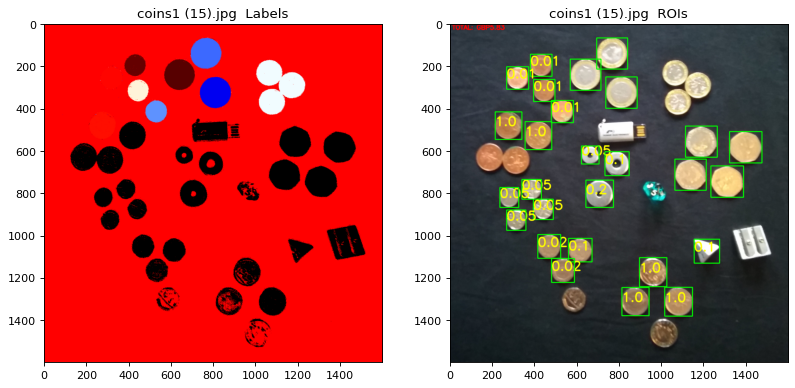

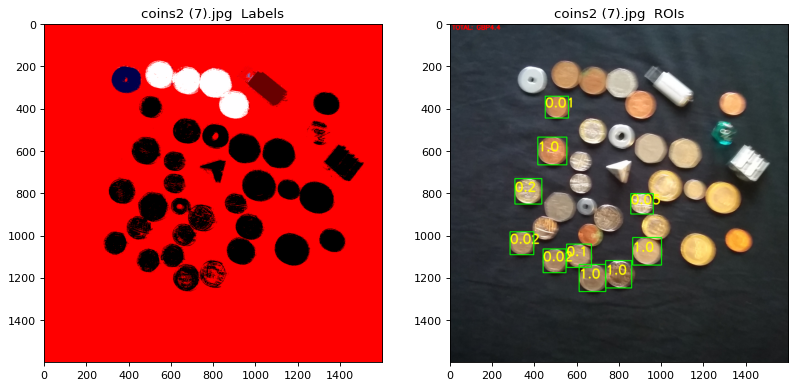

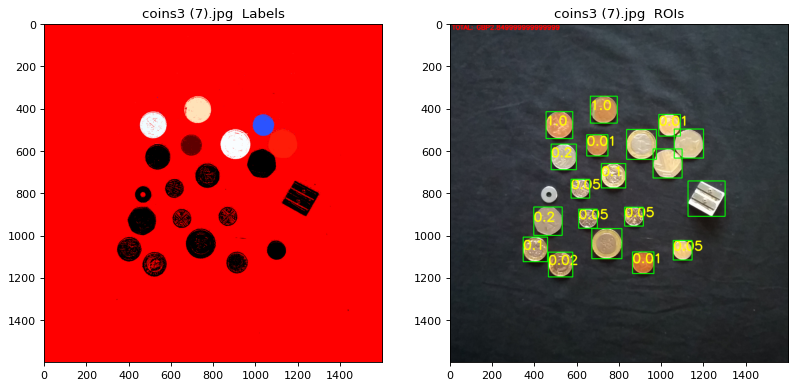

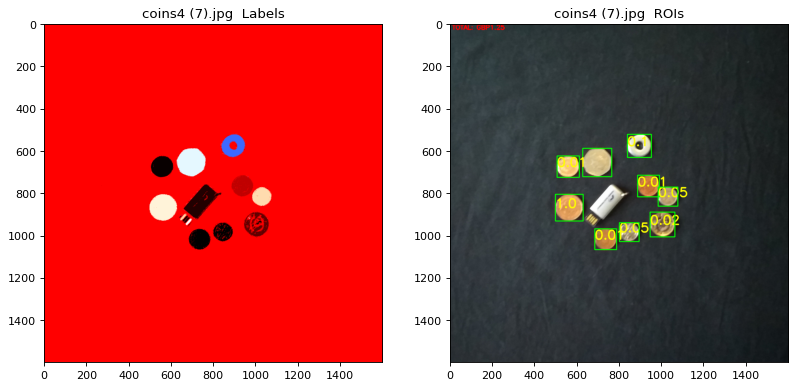

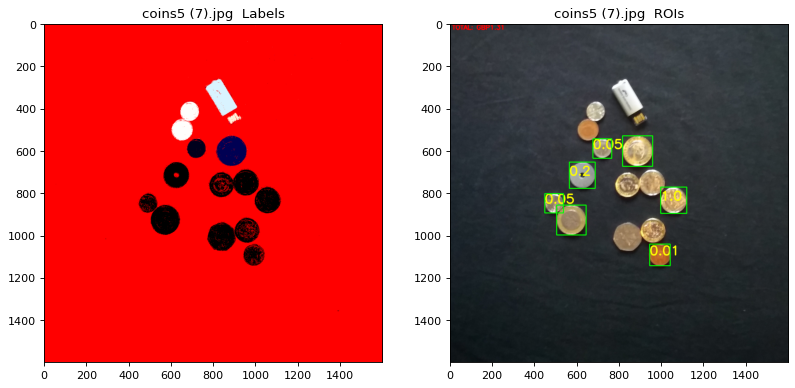

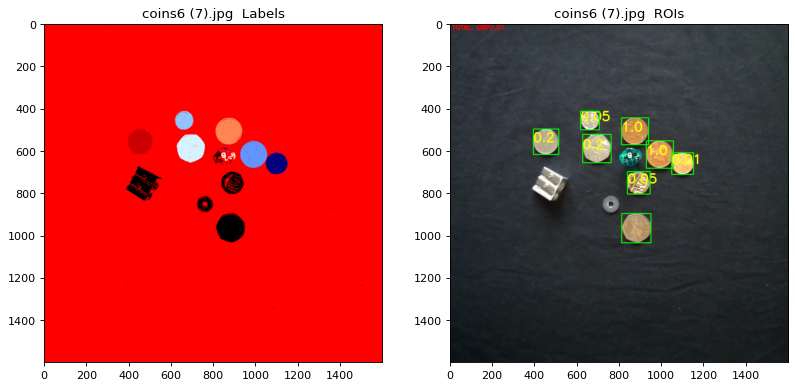

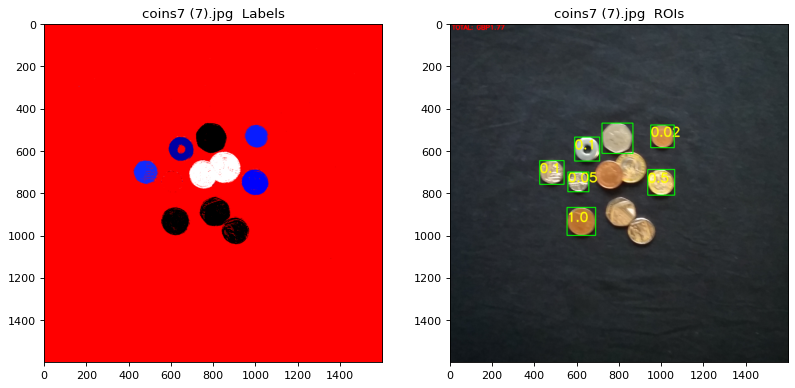

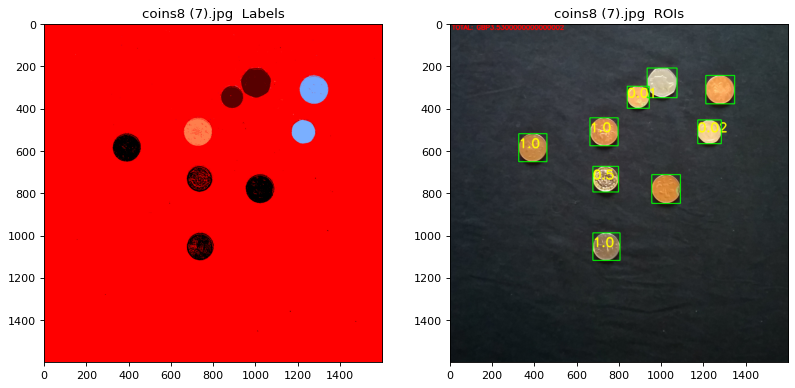

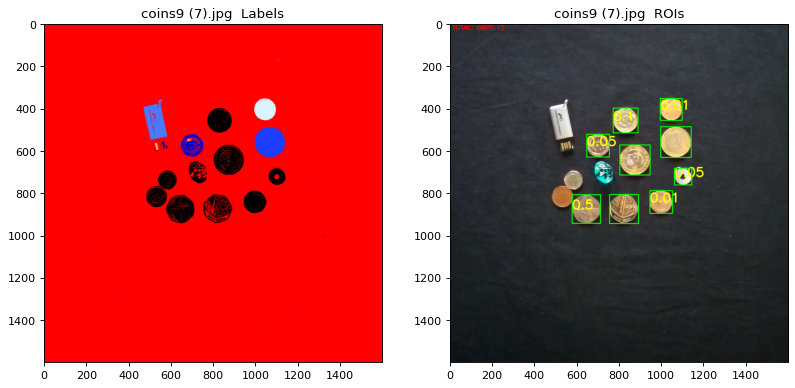

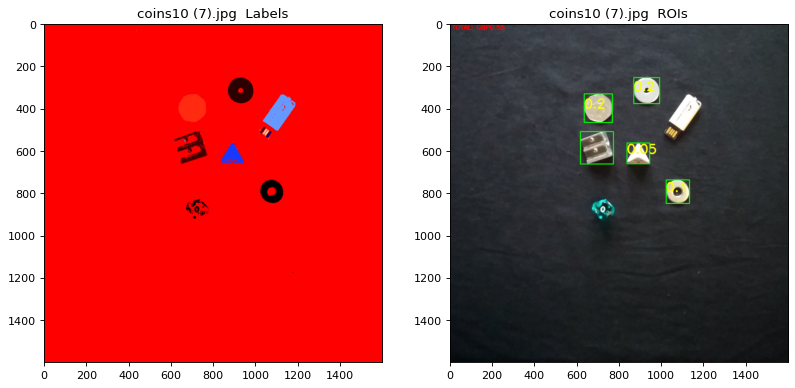

In [ ]:

# Replaced the current single-image processing code with this loop to allow for multiple images to be processed since the import file function allows for multiple to be uploaded, thus increasing ease of use for the user
for image_to_use in range(len(img_HSV)):  # Loop through all uploaded images
    fname = 'result_'+filename[image_to_use]+'.csv' #
    fp = open(fname, 'w')
    fp.write(' x1, y1,w,h,SatCent,SatSides,Value\n')
    TotalValue = 0

    # Get RGB again to clean up drawings if repeated execution
    imgRGB = cv2.cvtColor(cv2.imread(filename[image_to_use]), cv2.COLOR_BGR2RGB)

    # Process this specific image to get binary image
    # You need to repeat the binary image creation steps for each image
    src = cv2.imread(filename[image_to_use])
    # Apply the same processing steps as before to create binary image
    #create a laplace kernel for edge detection
    kernel = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]], dtype=np.float32)
    imgLaplacian = cv2.filter2D(src, cv2.CV_32F, kernel) #apply the laplace filter
    sharp = np.float32(src) #convert to float for processing
    imgResult = sharp - imgLaplacian # subtract laplace from org image to sharpen it
    imgResult = np.clip(imgResult, 0, 255)
    imgResult = imgResult.astype('uint8') #convert back to 8-bit format
    bw = cv2.cvtColor(imgResult, cv2.COLOR_BGR2GRAY) #convert to grayscale for thresholding
    _, bw = cv2.threshold(bw, 40, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU) # apply binary thresholding

    # Use bw as your binary image for this iteration
    binary = bw

    # Use connectedComponentsWithStats to retrieve blobs and stats
    (numLabels, labels_img, stats, centroids) = cv2.connectedComponentsWithStats(binary)
    #print image info and blob count
    print(f'Image {image_to_use+1}: {filename[image_to_use]}')
    print('Found ' + str(numLabels - 1) + ' blobs')

    for i in range(1, numLabels): #analyse each blob
        draw_ROI = 0
        #extract blob properties from stats
        x1 = stats[i, cv2.CC_STAT_LEFT] #left co-ord
        y1 = stats[i, cv2.CC_STAT_TOP] #top co-ord
        w = stats[i, cv2.CC_STAT_WIDTH] #width
        h = stats[i, cv2.CC_STAT_HEIGHT] #height
        area = stats[i, cv2.CC_STAT_AREA] #area in pixels
        (cX, cY) = centroids[i]          #centre co-ords

        #filter step 1: check if blob is close in shape to a square (coins we want are circular)
        if abs(w-h) > 10:  # too unsquare
            print('Blob '+str(i) +' too unsquare!')
        else:
            #filter step 2: check if blob is large enough to be a coin
            size = (h + w)/2 #too small
            if size < 80:
                print('Blob '+str(i) +' too small!')
            else:
                #blob made it past filter step so is likely a coin
                print('Blob '+ str(i) +' IS COIN') #is a coin = SUCCESS
                draw_ROI = 1
                (value, SatC, SatSide) = classify(x1, y1, w, h, area, image_to_use)
                if value == -1:
                    print('Unknown value!') #failed to classify the blob
                else:
                    cv2.putText(imgRGB, str(value), (int(x1), int(y1+h/2)),
                                cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 0), 6)
                    print('Value=' + str(value))
                    TotalValue = TotalValue + value #add this coin to the running total for the image
                    # save result to text file
                    fp.write(str(x1)+','+str(y1)+','+str(w)+','+str(h)+','+
                             str(int(SatC))+','+str(int(SatSide))+','+str(value)+'\n')
                    #if valid coin then draw a rectangle around it
            if draw_ROI:
                cv2.rectangle(imgRGB, (x1, y1), (x1+w, y1+h), (0, 255, 0), 3)

    fp.close()
# Add total value text to the image
    cv2.putText(imgRGB, f"TOTAL: GBP{TotalValue}", (10, 30), #succesfully added it to the image but had an encoding problem with the pound sign as it would just display '??' so changed to GBP and it worked
            cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 3)
    # Plot results for this image
    fig = plt.figure(figsize=(12, 6), dpi=80)
    ax = fig.add_subplot(121, aspect='auto')
    ax.imshow(labels_img, cmap='flag', vmin=0, vmax=255)
    ax.set_title(filename[image_to_use] + '  Labels')
    ax = fig.add_subplot(122, aspect='auto')
    ax.imshow(imgRGB)
    ax.set_title(filename[image_to_use] + '  ROIs')

    print('TOTAL: £' + str(TotalValue)) # print total value of image, not sure how to get this seperated from the huge list of blob checks so it is messy to find each pictures coin total
                                        # managed to add the total to the image was just putting it in the wrong place so put it before the image plot code and it fixed it the problem.
